<a href="https://colab.research.google.com/github/piglesias98/VisionPorComputador/blob/master/practica3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Práctica 3

## Librerías necesarias

In [0]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import copy
import math

## Imágenes

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
path = "/content/drive/My Drive/VC/imagenes"

## Funciones auxiliares

Función para pintar las imágenes

In [0]:

#Función que representa las imágenes de un array en las columnas y el tamaño que se le indique
def representar_imagenes(lista_imagen_leida, lista_titulos, n_col=2, tam=15):

	# Comprobamos que el numero de imágenes corresponde con el número de títulos pasados
	if len(lista_imagen_leida) != len(lista_titulos):
		print("No hay el mismo número de imágenes que de títulos.")
		return -1 # No hay el mismo numero de imágenes que de títulos

	# Calculamos el numero de imagenes
	n_imagenes = len(lista_imagen_leida)

	# Calculamos el número de filas
	n_filas = (n_imagenes // n_col) + (n_imagenes % n_col)

	# Establecemos por defecto un tamaño a las imágenes
	plt.figure(figsize=(tam,tam))

	# Recorremos la lista de imágenes
	for i in range(0, n_imagenes):

		plt.subplot(n_filas, n_col, i+1) # plt.subplot empieza en 1

		if (len(np.shape(lista_imagen_leida[i]))) == 2: # Si la imagen es en gris
			plt.imshow(lista_imagen_leida[i], cmap = 'gray')
		else: # Si la imagen es en color
			plt.imshow(cv2.cvtColor(lista_imagen_leida[i], cv2.COLOR_BGR2RGB))

		plt.title(lista_titulos[i]) # Añadimos el título a cada imagen

		plt.xticks([]), plt.yticks([]) # Para ocultar los valores de tick en los ejes X e Y

	plt.show()

## Ejercicio 1 Puntos de Harris

Función que genera una pirámide gaussiana

In [0]:
def piramide_gaussiana(im, n=4):
  # Se crea la lista donde se alojan las imágenes
  imagenes = list()
  # Se añade la imagen original a la lista
  imagenes.append(im)
  for i in range(n):
    imagenes.append(cv2.pyrUp(cv2.pyrDown(imagenes[i])))
    # En lugar de dejar las imágenes pequeñas las ponemos en el tamaño original con pyrup
  return imagenes

Función que realiza un alisamiento gaussiano

In [0]:
def convolucion(imagen, kernelx, kernely, border=cv2.BORDER_DEFAULT, normalize=True):
    kernelx = np.flip(kernelx)
    kernely= np.flip(kernely)
    img = np.copy(imagen)
    height, width = imagen.shape[:]
    for i in range(height):
        resConv = cv2.filter2D(img[i, :], -1, kernelx, border)
        img[i, :] = [sublist[0] for sublist in resConv]
    for j in range(width):
        resConv = cv2.filter2D(img[:, j], -1, kernely, border)
        img[:, j] = [sublist[0] for sublist in resConv]
    if normalize:
        cv2.normalize(img, img, 0, 255, cv2.NORM_MINMAX)
    return img

#Función que aplica un filtro gaussiano de un sigma dado a la imagen
def gaussiana(imagen, sigma, borde=cv2.BORDER_DEFAULT):
    img = np.copy(imagen)
    tam = 6*sigma +1
    kernel = cv2.getGaussianKernel(tam, sigma)
    imgConv = convolucion(img, kernel, kernel, borde)
    return imgConv

In [0]:
img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
RGB_im = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#plt.imshow(RGB_im)
pir = piramide_gaussiana(img)
#plt.imshow(cv2.cvtColor(pir[0], cv2.COLOR_BGR2RGB))
#plt.imshow(cv2.cvtColor(pir[1], cv2.COLOR_BGR2RGB))
#plt.imshow(cv2.cvtColor(pir[2], cv2.COLOR_BGR2RGB))
#plt.imshow(cv2.cvtColor(pir[3], cv2.COLOR_BGR2RGB))
#plt.imshow(cv2.cvtColor(pir[4], cv2.COLOR_BGR2RGB))

Función que detecta los puntos Harris

**Función que calcula el criterio de Harris**

Si se quiere obtener los puntos Harris de una imagen utilizando el operador Harris, es necesario seguir un criterio. En este caso se hará uso de los autovalores de M (l1, l2) y de la constante k.
El criterio es: l1*l2 - k * (l1+l2)^2

In [0]:
def criterio_harris(l1, l2, k = 0.04):
  # Se devuelve el valor dado siguiendo el criterio
  return ((l1*l2) - (k*((l1+l2)*(l1+l2))))

**Detector de esquinas de Harris**

In [0]:
def detector_esquinas(imagen, block_size, k_size, k = 0.04):
  # Se calculan los autovalores y los autovectores de la imagen
    vals_and_vecs = cv2.cornerEigenValsAndVecs(imagen, block_size, k_size)
    vals_and_vecs = cv2.split(vals_and_vecs)
    l1 = vals_and_vecs[0]
    l2 = vals_and_vecs[1]
    harris = criterio_harris(l1, l2, k)
    return harris

Vemos qué nos devuelve el detector de esquinas por sí solo y lo comparamos con la función propia de OpenCV


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


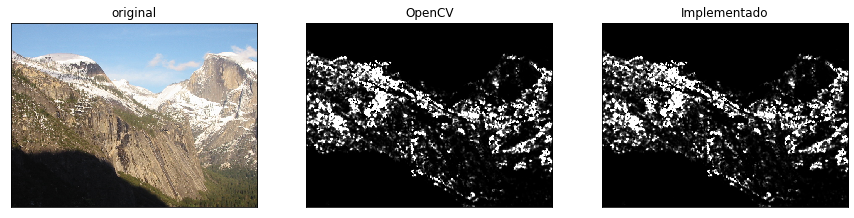

In [0]:
img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
#La imagen debe estar en escala de grises para que la puedan procesar los detectores
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)  
esquinas = detector_esquinas(img_gris, 5, 7) #MEJOR 5 Y 7
esquinasMergeado = cv2.merge([esquinas, esquinas, esquinas])
#plt.imshow(esquinasMergeado)
opencv = cv2.cornerHarris(img_gris,5, 7, 0.04)
opencvmerge = cv2.merge([opencv, opencv, opencv])
representar_imagenes([img, esquinasMergeado, opencvmerge], ["original", "OpenCV", "Implementado"],3)

**Función que calcula la supresión de no máximos**

Para calcular la supresión de no máximos necesitaremos una matriz de valores=0 (negra). 
Pasearemos una ventana de tamaño impar para tener un valor central por la matriz de los valores Harris. 
- Si el elemento central de la matriz es el máximo local en la ventana --> todos los valores de la ventana serán 0 menos el central que será 255
- Si el elemento no es máximo local --> se pondrá a 0 (él solo)

Definiremos un umbral de 0.05


Suprime los valores no-máximos de una matriz (harris). Elimina los puntos que, aunque tengan un valor alto de criterio Harris, no son máximos locales de su entorno (env) para un tamaño de entorno prefijado.
Permite la utilización de un umbral (threshold) para eliminar aquellos puntos Harris que se consideren elevados.
Devuelve una lista con los keyPoints y su valor correspondiente.

Función auxiliar: maximo local, para determinar si el elemento central de la ventana es 0

In [0]:
def maximo_local(data):
    # Calculamos la dimensión de la matriz recibida
    shape = data.shape
    # Se calcula el centro de los datos
    center = data[round(shape[0]/2)-1, round(shape[0]/2)-1]
    # Se devuelve si el centro es el máximo o no
    return center == np.max(data)

Función auxiliar: modificar ceros --> pone a 0 una región cuadrada de una matriz

In [0]:
def modificar_ceros(matriz, filas, columnas, tam):
  matriz[filas-int(tam/2):(filas+1)+int(tam/2), columnas-int(tam/2):(columnas+1)+int(tam/2)]=0

Supresión de no máximos

In [0]:
def supresion_no_maximos(imagen, tam, umbral):
  print(imagen.shape)
  img = copy.deepcopy(imagen)
  pos_inicial = int(tam/2)
  pos_final_filas = imagen.shape[0] - pos_inicial
  pos_final_columnas = imagen.shape[1] - pos_inicial
  #Creamos una matriz del mismo tamaño que la original en negro
  negro = np.zeros((imagen.shape[0], imagen.shape[1]))
  for i in range(pos_inicial, pos_final_filas):
    for j in range(pos_inicial, pos_final_columnas):
      ventana = img[i-pos_inicial:(i+1)+pos_inicial, j-pos_inicial:(j+1)+pos_inicial]
      if (maximo_local(ventana) and np.amax(ventana)>umbral):
        modificar_ceros(negro, i, j, tam)
        negro[i][j] = 255 #el máximo local será blanco
  return negro  

Veamos como se ve la imagen original con los puntos de Harris

(480, 640)
478 pos_final_filas
638 pos_final_col


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


477
637


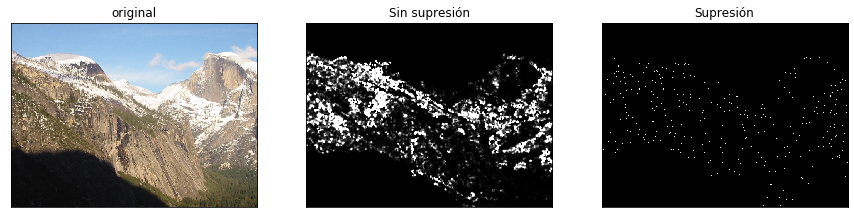

In [33]:
img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
#La imagen debe estar en escala de grises para que la puedan procesar los detectores
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)  
esquinas = detector_esquinas(img_gris, 5, 7) #MEJOR 5 Y 7
esquinasMergeado = cv2.merge([esquinas, esquinas, esquinas])
maximos = supresion_no_maximos(esquinas, 5, 0.05)
representar_imagenes([img, esquinasMergeado, maximos], ["original",  "Sin supresión", "Supresión"],3)

Veamos cuantos puntos se extraen en cada escala de la pirámide gaussiana

(480, 640)
478 pos_final_filas
638 pos_final_col
477
637
(480, 640)
478 pos_final_filas
638 pos_final_col
477
637
(480, 640)
478 pos_final_filas
638 pos_final_col
477
637
(480, 640)
478 pos_final_filas
638 pos_final_col
477
637
(480, 640)
478 pos_final_filas
638 pos_final_col
477
637


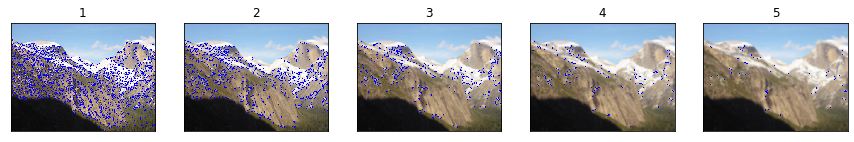

In [34]:
img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
#La imagen debe estar en escala de grises para que la puedan procesar los detectores
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
piramide_color =  piramide_gaussiana(img)
piramide_gris = piramide_gaussiana(img_gris)
for escala in range(len(piramide_gris)):
  harris = detector_esquinas(piramide_gris[escala], 5, 7, 0.04)
  supresion = supresion_no_maximos(harris, 5, 0.05)
  for i in range(len(supresion)):
    for j in range(len(supresion[i])):
      if (supresion[i][j]==255):
        cv2.circle(piramide_color[escala], (j,i), 1, (255,0,0), 2)
representar_imagenes(piramide_color, ["1",  "2", "3", "4", "5"], 5)



Por cada punto deberemos extraer una estructura KeyPoint (x, y, escala, orientacion)


Obtener los keypoints

In [0]:
# Función para crear el vector de keypoints.
def keypoints(imagen, harris, nivel, blocksize):
  img = copy.deepcopy(imagen)
  # vector de keypoints
  kp = []
  #Realizamos un alisamiento fuerte con sigma = 4.5, aproximado sigma = 5
  sigma = 5
  ksize = 3
  img = gaussiana(img, sigma)
  #Calculo las derivadas
  derx = cv2.Sobel(img, cv2.CV_32F,1,0,ksize)
  dery = cv2.Sobel(img, cv2.CV_32F,0,1,ksize)
  #orientaciones = orientaciones(img, harris)
  #Calculo las coordenadas x e y de cada punto
  for i in range(len(harris)):
    for j in range(len(harris[i])):
      if (harris[i][j]==255):
        px = j
        py = i
        angulo = np.arctan2(dery[i,j],derx[i,j])*180/np.pi
        tam = (nivel+1) * blocksize
        #Utilizamos nivel + 1 para que en el caso de la imagen original en la pirámide,
        #en el que la escala es 0, pueda pintar los keypoints
        kp.append(cv2.KeyPoint(x=px,y=py,_angle=angulo ,_size=tam))

  return kp

(480, 640)


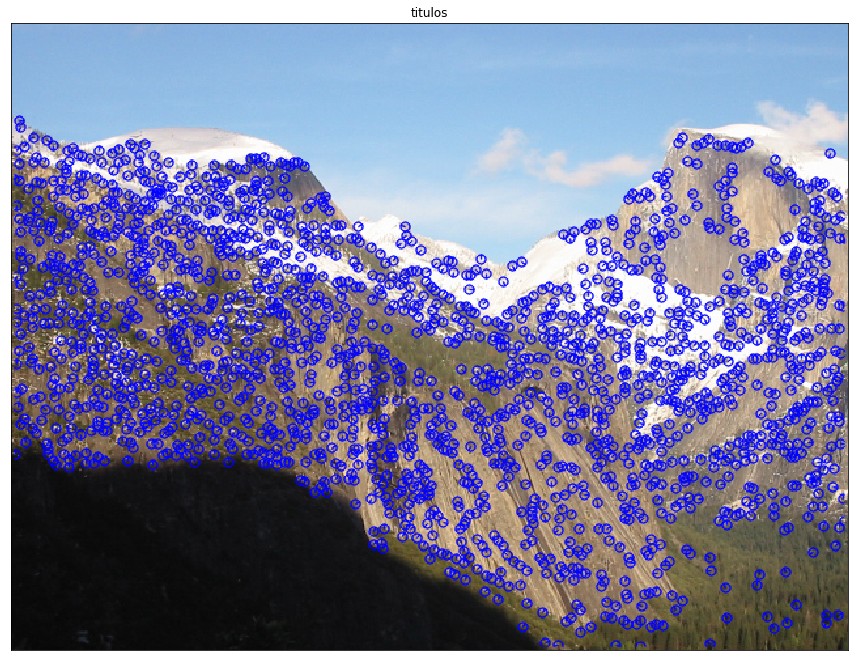

In [115]:
img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
#La imagen debe estar en escala de grises para que la puedan procesar los detectores
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
harris = detector_esquinas(img_gris, 5, 7, 0.04)
supresion = supresion_no_maximos(harris, 5, 0.05)
img_salida = copy.deepcopy(img)
kp = keypoints(img_gris, supresion, escala, 7)
img_salida = cv2.drawKeypoints(img, kp, outImage = img_salida, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color=(255,0,0) )
representar_imagenes([img_salida],["titulos"], 1)

(480, 640)
1608 keypoints
[<KeyPoint 0x7f7673d39c60>, <KeyPoint 0x7f7673d39420>, <KeyPoint 0x7f7673d393f0>, <KeyPoint 0x7f7673d39090>, <KeyPoint 0x7f7673d39480>, <KeyPoint 0x7f7673d393c0>, <KeyPoint 0x7f7673d39cc0>, <KeyPoint 0x7f7673d39120>, <KeyPoint 0x7f7673d39f00>, <KeyPoint 0x7f7673d39570>, <KeyPoint 0x7f7673d390c0>, <KeyPoint 0x7f7673d39030>, <KeyPoint 0x7f7673d39ed0>, <KeyPoint 0x7f7673d39180>, <KeyPoint 0x7f7673d39e70>, <KeyPoint 0x7f7673d39d20>, <KeyPoint 0x7f7673d39f60>, <KeyPoint 0x7f7673d39e40>, <KeyPoint 0x7f7673d39d50>, <KeyPoint 0x7f7673d39c00>, <KeyPoint 0x7f7673d39de0>, <KeyPoint 0x7f7673d39f90>, <KeyPoint 0x7f7673d39d80>, <KeyPoint 0x7f7673d39c90>, <KeyPoint 0x7f7673d39ba0>, <KeyPoint 0x7f7673d39f30>, <KeyPoint 0x7f7673d39fc0>, <KeyPoint 0x7f7673d39e10>, <KeyPoint 0x7f7673d39b70>, <KeyPoint 0x7f7671806090>, <KeyPoint 0x7f7671806060>, <KeyPoint 0x7f76718060f0>, <KeyPoint 0x7f76718060c0>, <KeyPoint 0x7f7671806150>, <KeyPoint 0x7f7671806180>, <KeyPoint 0x7f76718061e0>, <

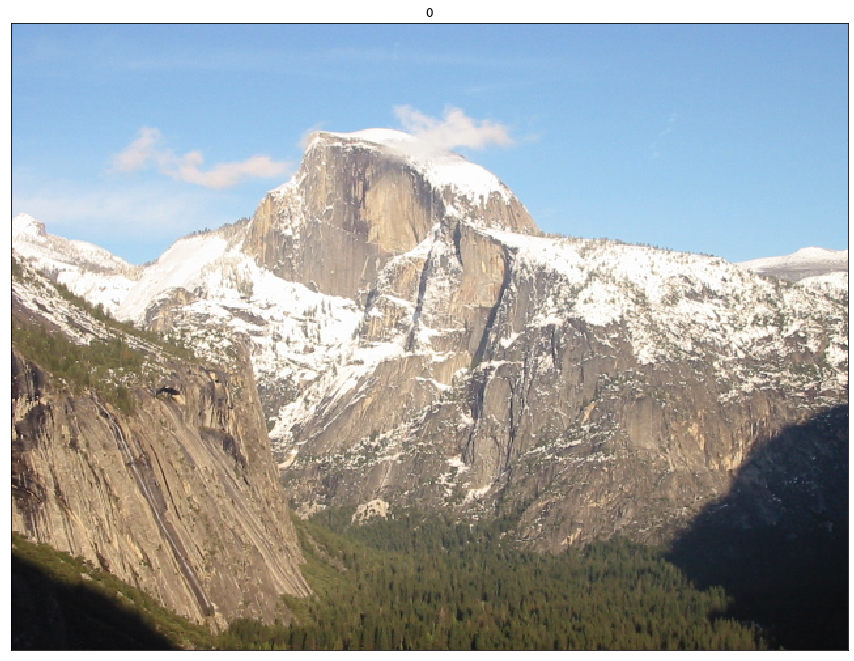

In [110]:
img = cv2.imread(path + '/yosemite/Yosemite2.jpg')
#La imagen debe estar en escala de grises para que la puedan procesar los detectores
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
piramide_color =  piramide_gaussiana(img)
piramide_gris = piramide_gaussiana(img_gris)
escala = 0
harris = detector_esquinas(piramide_gris[escala], 5, 7, 0.04)
supresion = supresion_no_maximos(harris, 5, 0.05)
kp = keypoints(piramide_gris[escala], supresion, 3, 7)
print(len(kp),"keypoints")
print(kp)
cv2.drawKeypoints(piramide_color[escala], kp, piramide_color[escala], flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color=(0,0,255) )
representar_imagenes([piramide_color[escala]],["0"], 1,15)

0 ESCALA
(480, 640)
1784 keypoints
1 ESCALA
(480, 640)
992 keypoints
2 ESCALA
(480, 640)
418 keypoints
3 ESCALA
(480, 640)
173 keypoints
4 ESCALA
(480, 640)
63 keypoints


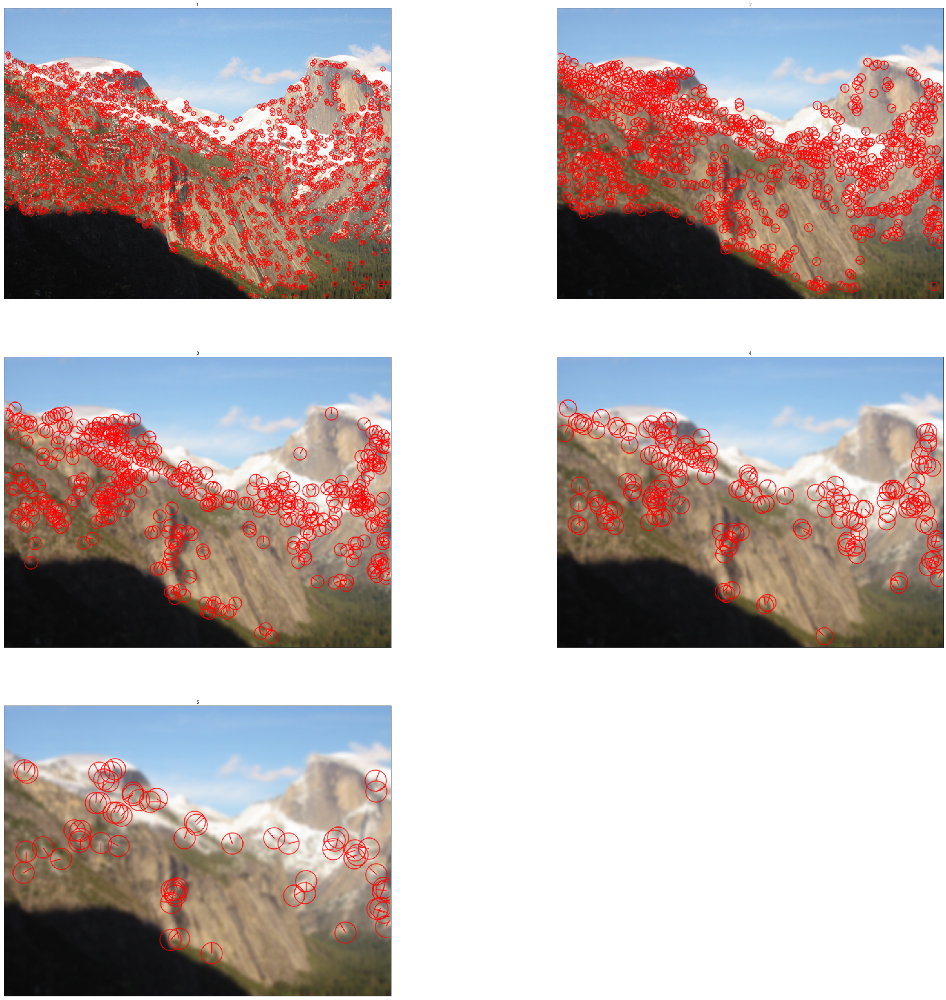

In [44]:
img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
#La imagen debe estar en escala de grises para que la puedan procesar los detectores
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
piramide_color =  piramide_gaussiana(img)
piramide_gris = piramide_gaussiana(img_gris)
salida = []
for escala in range(len(piramide_gris)):
  print(escala, "ESCALA")
  harris = detector_esquinas(piramide_gris[escala], 5, 7, 0.04)
  supresion = supresion_no_maximos(harris, 5, 0.05)
  kp = keypoints(piramide_gris[escala], supresion, escala, 7)
  print(len(kp),"keypoints")
  cv2.drawKeypoints(piramide_color[escala], kp, piramide_color[escala], flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color=(0,0,255) )
representar_imagenes(piramide_color, ["1",  "2", "3", "4", "5"], 2, 50)


0 ESCALA
(480, 640)
1 keypoints
1 ESCALA
(480, 640)
2 keypoints
2 ESCALA
(480, 640)
3 keypoints
3 ESCALA
(480, 640)
4 keypoints
4 ESCALA
(480, 640)
5 keypoints


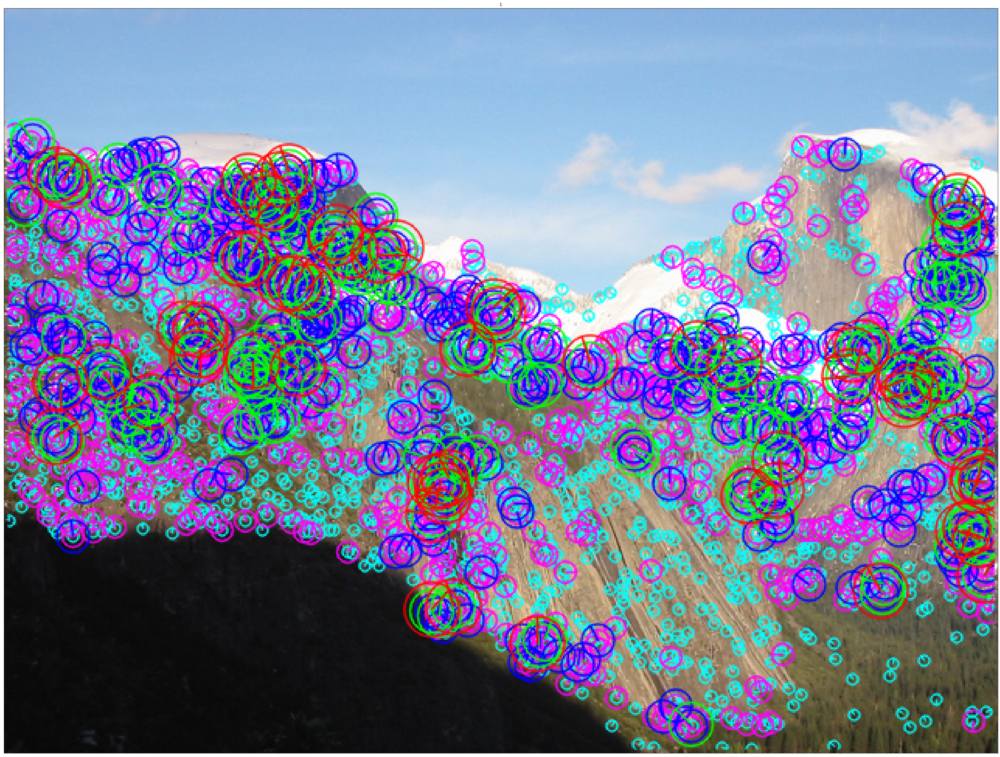

In [45]:
img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
#La imagen debe estar en escala de grises para que la puedan procesar los detectores
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
piramide_color =  piramide_gaussiana(img)
piramide_gris = piramide_gaussiana(img_gris)
kp = []
for escala in range(len(piramide_gris)):
  print(escala, "ESCALA")
  harris = detector_esquinas(piramide_gris[escala], 5, 7, 0.04)
  supresion = supresion_no_maximos(harris, 5, 0.05)
  kp.append(keypoints(piramide_gris[escala], supresion, escala, 7))
  print(len(kp),"keypoints")


colores = [(255,255,0),(255,0,255),(255,0,0),(0,255,0),(0,0,255)]
for i in range(len(kp)):
  cv2.drawKeypoints(piramide_color[0], kp[i], piramide_color[0], flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color = colores[i] )

representar_imagenes([piramide_color[0]], ["1"], 1, 50)

Calcular las coordenadas subpixel (x, y) de cada KeyPoint usando la función cornerSubPix de OpenCV y mostrar una imagen interpolada del entorno de las coordenadas (solo un entorno 10x10 a un zoom 5x) de una selección aleatoria de 3 de ellos en donde se marquen las coordenadas originales y las corregidas.

In [75]:
img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
#La imagen debe estar en escala de grises para que la puedan procesar los detectores
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
piramide_color =  piramide_gaussiana(img)
piramide_gris = piramide_gaussiana(img_gris)
kp = []
for escala in range(len(piramide_gris)):
  print(escala, "ESCALA")
  harris = detector_esquinas(piramide_gris[escala], 5, 7, 0.04)
  supresion = supresion_no_maximos(harris, 5, 0.05)
  kp.append(keypoints(piramide_gris[escala], supresion, escala, 7))
  print(len(kp[escala]),"keypoints")

print(len(kp))

flat_kp = []
for sublist in kp:
    for item in sublist:
        flat_kp.append(item)

print(len(flat_kp))

print(flat_kp[2999])
print(flat_kp[0].pt[0])
print(flat_kp[0].pt[1])
print(flat_kp[0].angle)
print(flat_kp[0].octave)


0 ESCALA
(480, 640)
1784 keypoints
1 ESCALA
(480, 640)
992 keypoints
2 ESCALA
(480, 640)
418 keypoints
3 ESCALA
(480, 640)
173 keypoints
4 ESCALA
(480, 640)
63 keypoints
5
3430
<KeyPoint 0x7f7671adfd20>
6.0
75.0
0.0
0


In [84]:
img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
#La imagen debe estar en escala de grises para que la puedan procesar los detectores
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
piramide_color =  piramide_gaussiana(img)
piramide_gris = piramide_gaussiana(img_gris)
kp = []
for escala in range(len(piramide_gris)):
  print(escala, "ESCALA")
  harris = detector_esquinas(piramide_gris[escala], 5, 7, 0.04)
  supresion = supresion_no_maximos(harris, 5, 0.05)
  kp.append(keypoints(piramide_gris[escala], supresion, escala, 7))
  print(len(kp[escala]),"keypoints")

print(len(kp))

flat_kp = []
for sublist in kp:
    for item in sublist:
        flat_kp.append(item)

print(len(flat_kp))

nuevas_coord = []
for escala in range(len(piramide_gris)):
  nuevas_coord.append([])
  for punto in flat_kp:
    if (punto.octave==escala):
      nuevas_coord[escala].append(np.array(np.float32([punto.pt[0],punto.pt[1]])))


criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
zerozone = (-1,1)

nuevas_coord = [(cv2.cornerSubPix(piramide_gris[i],
                                  np.array(nuevas_coord[i],
                                  (int(tam/2),int(tam/2)),
                                  zerozone,
                                  criteria)) for i in range(len(piramide_gris)))]
print(nuevas_coord)
nuevos_puntos=[]
for i in range(len(nuevas_coord)):
  for j in range(len(nuevas_coord[i])):
    nuevos_puntos.append((nuevas_coord[i][j][0],
                          nuevas_coord[i][j][1],i))



0 ESCALA
(480, 640)
1784 keypoints
1 ESCALA
(480, 640)
992 keypoints
2 ESCALA
(480, 640)
418 keypoints
3 ESCALA
(480, 640)
173 keypoints
4 ESCALA
(480, 640)
63 keypoints
5
3430
[<generator object <genexpr> at 0x7f7671c624c0>]


TypeError: ignored

(480, 640)
1784


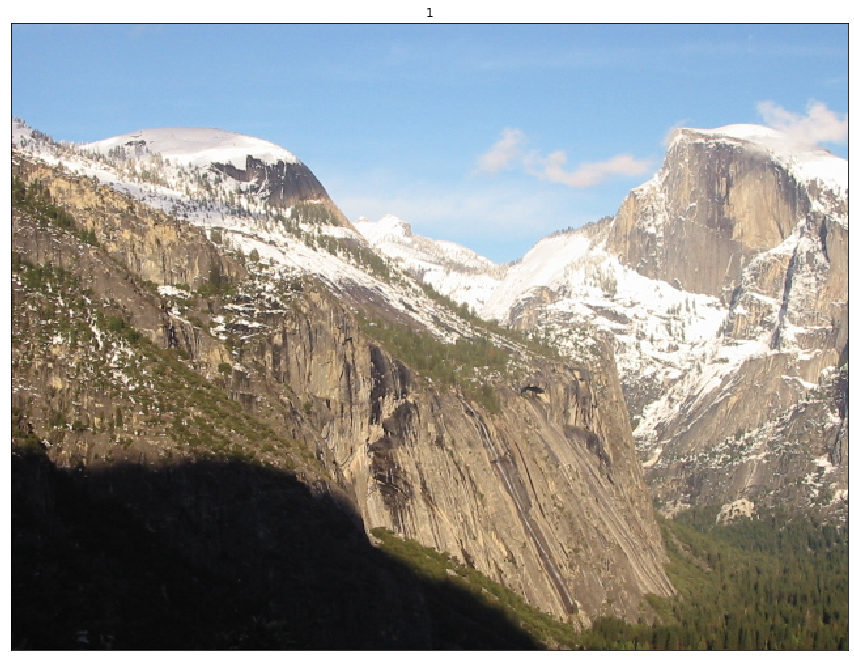

TypeError: ignored

In [98]:
img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
#La imagen debe estar en escala de grises para que la puedan procesar los detectores
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
harris = detector_esquinas(img_gris, 5, 7, 0.04)
supresion = supresion_no_maximos(harris, 5, 0.05)
kp=keypoints(img_gris, supresion, escala, 7)
print(len(kp))

cv2.drawKeypoints(img, kp, img, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color = (255,0,0) )
representar_imagenes([img1], ["1"],1, 15)






flat_kp = []
for sublist in kp:
    for item in sublist:
        flat_kp.append(item)

print(len(flat_kp))

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.001)

nuevos = list()
index = list()

nuevo_kp = flat_kp

for i, punto in enumerate(flat_kp):
  if (punto.octave == escala):
    nuevos.append(punto.pt)
    index.append(i)

nuevos = np.float32(nuevos)
zerozone = (-1,1)
cv2.cornerSubPix(img_gris, nuevos, (5,5),zerozone, criteria )

for i, punto in enumerate(nuevos_puntos):
  nuevo_kp[index[i]].pt = (punto[0],punto[1])

print(flat_kp)
print(nuevo_kp)
img1 = copy.deepcopy(img)
img2 = copy.deepcopy(img)
cv2.drawKeypoints(img1, kp[0], img1, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color = (255,0,0) )
cv2.drawKeypoints(img2, nuevo_kp, img2, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color = (255,0,0) )
#representar_imagenes([img1, img2], ["1", "2"], 2, 15)

0 ESCALA
(480, 640)
1 keypoints
1 ESCALA
(480, 640)
2 keypoints
2 ESCALA
(480, 640)
3 keypoints
3 ESCALA
(480, 640)
4 keypoints
4 ESCALA
(480, 640)
5 keypoints
1102
0


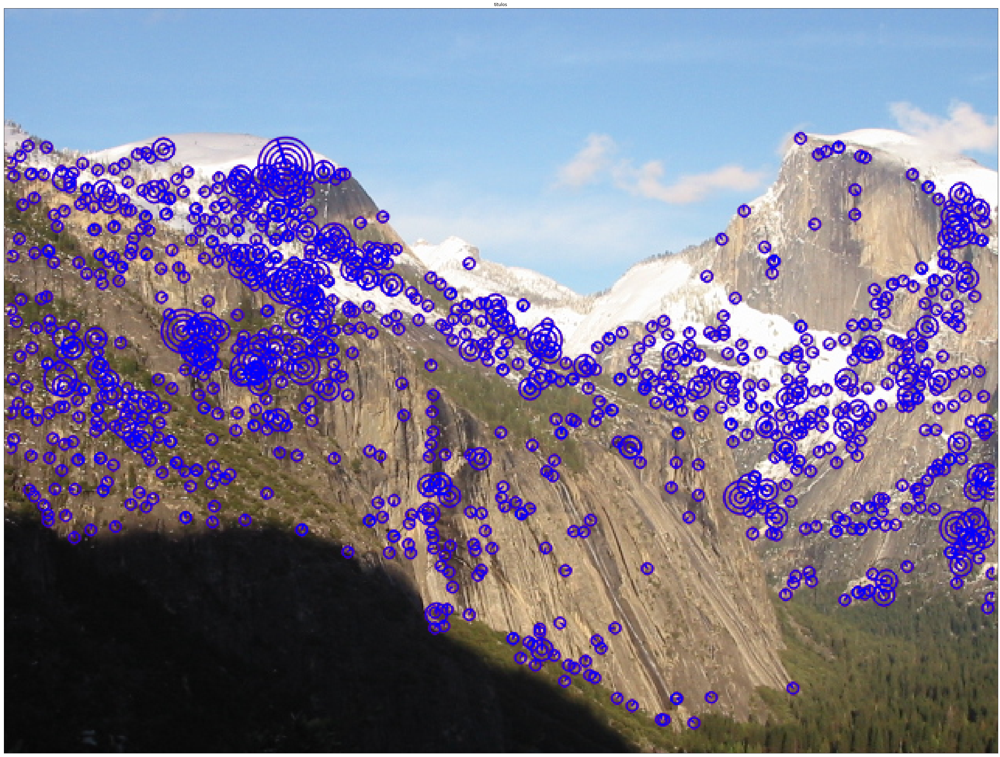

In [132]:
img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
#La imagen debe estar en escala de grises para que la puedan procesar los detectores
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
piramide_color =  piramide_gaussiana(img)
piramide_gris = piramide_gaussiana(img_gris)
kp = []
for escala in range(len(piramide_gris)):
  print(escala, "ESCALA")
  harris = detector_esquinas(piramide_gris[escala], 5, 7, 0.04)
  supresion = supresion_no_maximos(harris, 5, 0.7)
  kp.append(keypoints(piramide_gris[escala], supresion, escala, 7))
  print(len(kp),"keypoints")


flat_kp = []
for sublist in kp:
    for item in sublist:
        flat_kp.append(item)

print(len(flat_kp))

colores = [(255,255,0),(255,0,255),(255,0,0),(0,255,0),(0,0,255)]


criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.001)

nuevos = list()
index = list()

new_kp = flat_kp

for i, punto in enumerate(flat_kp):
  nuevos.append(punto.pt)
  index.append(i)

nuevos= np.float32(nuevos)

zerozone = (-1,1)
cv2.cornerSubPix(img_gris, nuevos, (5,5),zerozone, criteria )

for i, punto in enumerate(nuevos):
  new_kp[index[i]].pt = (punto[0],punto[1])

cont = 0
for i in range(len(flat_kp)):
  if (flat_kp[i].pt == new_kp[i].pt):
    cont+=cont
print(cont)


img_salida_nueva = copy.deepcopy(img)
img_salida = cv2.drawKeypoints(img, flat_kp, outImage = img_salida, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color=(0,0,255) )
img_salida = cv2.drawKeypoints(img_salida, new_kp, outImage = img_salida, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color=(255,0,0) )
representar_imagenes([img_salida],["titulos"], 1, 50)

## Ejercicio 2 Descriptores AKAZE

Detectar y extraer los **descriptores AKAZE** de OpenCV, usando para ello detectAndCompute() . Establecer las correspondencias existentes entre cada dos imágenes usando el objeto BFMatcher de OpenCV y los criterios de correspondencias “BruteForce+crossCheck y “Lowe-Average-2NN”. Mostrar ambas imágenes en un mismo canvas y pintar líneas de diferentes colores entre las coordenadas de los puntos en correspondencias. Mostrar en cada caso un máximo de 100 elegidas aleatoriamente.